In [3]:
import os

import rasterio
from rasterio.plot import reshape_as_image
import rasterio.mask
from rasterio.features import rasterize

import pandas as pd
import geopandas as gpd
from shapely.geometry import mapping, Point, Polygon
from shapely.ops import cascaded_union

import numpy as np
import cv2
import matplotlib.pyplot as plt

Reading Raster with rasterio

In [2]:
file_name='T36UXV_20200406T083559_TCI_10m.jp2'

with rasterio.open(file_name, 'r', driver='JP2OpenJPEG') as src:
    raster_img = src.read()
    raster_meta = src.meta

Checking Raster shape and Meta

In [3]:
print(raster_img.shape)

(3, 10980, 10980)


In [4]:
print(raster_meta)

{'driver': 'JP2OpenJPEG', 'dtype': 'uint8', 'nodata': None, 'width': 10980, 'height': 10980, 'count': 3, 'crs': CRS.from_epsg(32636), 'transform': Affine(10.0, 0.0, 600000.0,
       0.0, -10.0, 5500020.0)}


In [5]:
raster_img = reshape_as_image(raster_img)

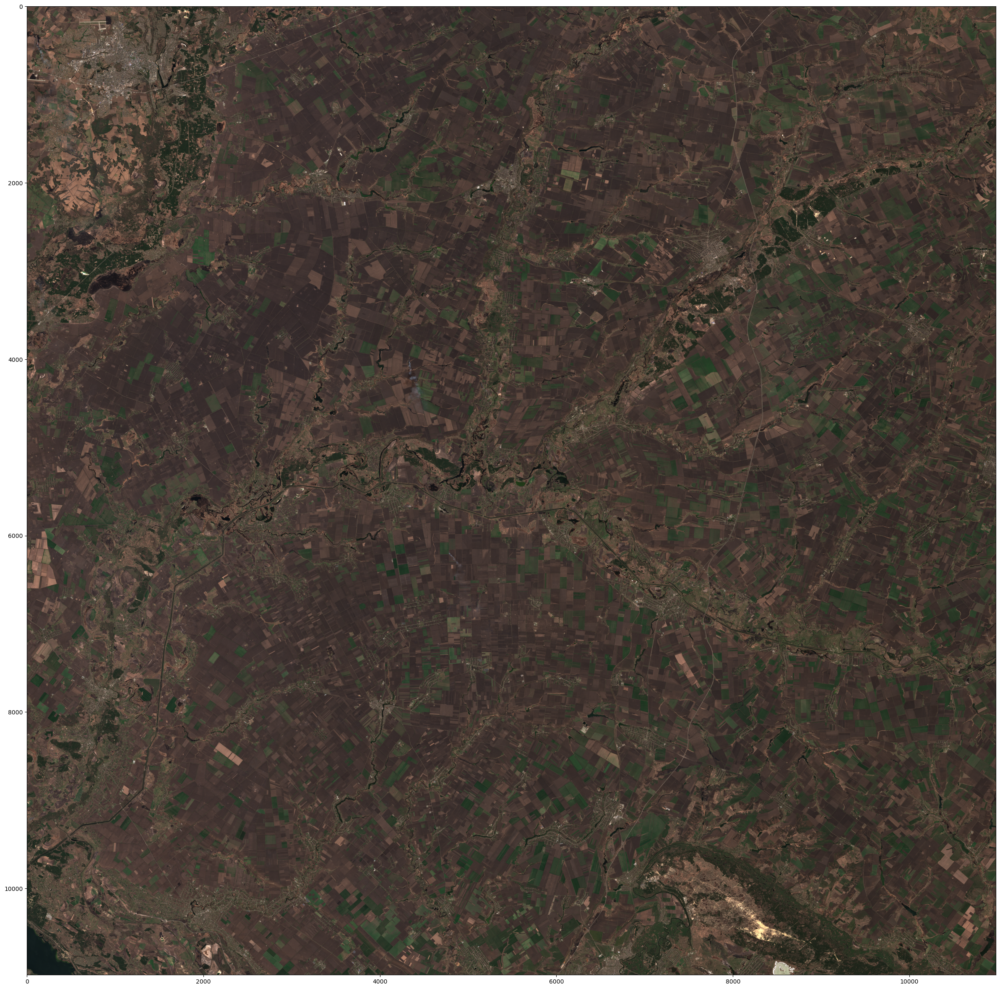

In [20]:
plt.figure(figsize=(30,30))
plt.imshow(raster_img)

Reading train labels with GeoPandas

In [7]:
train_df = gpd.read_file("./masks/Masks_T36UXV_20190427.shp")
print(len(train_df))
train_df.head(10)

936


,id,Data,Code,Descriptio,Comments,Image,geometry
0,None,None,2.0,branch of tree,None,T36UXV_20190427T083601,"POLYGON ((35.62916 49.60293, 35.63015 49.60163..."
1,None,None,1.0,color+ feathers,None,T36UXV_20190427T083601,"POLYGON ((35.65070 49.60254, 35.65248 49.60301..."
2,None,None,2.0,brahch of tree,None,T36UXV_20190427T083601,"POLYGON ((35.63023 49.60826, 35.62960 49.60920..."
3,None,None,1.0,color+ feathers,None,T36UXV_20190427T083601,"POLYGON ((35.62033 49.60905, 35.62064 49.60968..."
4,None,None,1.0,color+ feathers,None,T36UXV_20190427T083601,"POLYGON ((35.60455 49.61078, 35.60597 49.61228..."
5,None,None,1.0,color+ feathers,None,T36UXV_20190427T083601,"POLYGON ((35.60783 49.59848, 35.60736 49.59897..."
6,None,None,1.0,color+ feathers,None,T36UXV_20190427T083601,"POLYGON ((35.59871 49.60834, 35.59859 49.60857..."
7,None,None,2.0,branch of tree,None,T36UXV_20190427T083601,"POLYGON ((35.58841 49.60416, 35.58869 49.60433..."
8,None,None,2.0,branch of tree,None,T36UXV_20190427T083601,"POLYGON ((35.59142 49.60402, 35.59172 49.60377..."
9,None,None,1.0,color+ feathers,None,T36UXV_20190427T083601,"POLYGON ((35.58347 49.61376, 35.58220 49.61355..."


In [46]:
train_df.Descriptio.values

array(['branch of tree', 'color+ feathers', 'brahch of tree',
       'color+ feathers', 'color+ feathers', 'color+ feathers',
       'color+ feathers', 'branch of tree', 'branch of tree',
       'color+ feathers', 'color+ feathers', 'branch of tree',
       'color+ feathers', 'branch of tree', 'branch of tree',
       'color+ feathers', 'branch of tree', 'branch of tree',
       'color+ feathers', 'color+ feathers', 'color+ feathers',
       'color+ feathers + branch', 'branch of tree', 'color + feathers',
       'color + feathers', 'branch of tree', 'color+ feathers',
       'branch of tree', 'branch + color+ feathers',
       'branch + color+ feathers', 'color+ feathers', 'branch of tree',
       'branch of tree', 'color+ feathers', 'color+ feathers',
       'branch of tree', 'small branch', '???', 'color+ feathers',
       'color+ feathers', 'color+ feathers', 'small branch',
       'color+ feathers', 'branch of tree', '???', 'branch of tree',
       'branch of tree', 'color+ feathe

In [8]:
train_df['geometry'][0].exterior.coords.xy

(array('d', [35.62916346617293, 35.63014960535702, 35.631175190108465, 35.631214635675825, 35.630031268654925, 35.62888734720139, 35.62813788142149, 35.62774342574785, 35.62813788142149, 35.62916346617293]),
 array('d', [49.602931546762534, 49.60162984303954, 49.60080148612491, 49.59981534694083, 49.6001703570471, 49.60111705066382, 49.60214263541526, 49.60289210119517, 49.60312877459935, 49.602931546762534]))

Checking coordinates of polygon using Polygon methods

In [9]:
src = rasterio.open(file_name, 'r')
failed = []
for num, row in train_df.iterrows():
    try:
        masked_image, out_transform = rasterio.mask.mask(src, [mapping(row['geometry'])], crop=True, nodata=0)
    except:
        failed.append(num)
print("Rasterio failed to mask {} files".format(len(failed)))



Rasterio failed to mask 936 files


Converting GeoDataframe to raster CRS

In [25]:
train_df = gpd.read_file("./masks/Masks_T36UXV_20190427.shp")


# let's remove rows without geometry
train_df = train_df[train_df.geometry.notnull()]

# assigning crs
# -------------------------!!!!!!!!!!!!!! check this number


train_df.crs = {'init' :'epsg:4055'}

#transforming polygons to the raster crs
train_df = train_df.to_crs({'init' : raster_meta['crs']['init']})


/Users/paulinarega/opt/anaconda3/envs/newenv/lib/python3.9/site-packages/pyproj/crs/crs.py:130: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/Users/paulinarega/opt/anaconda3/envs/newenv/lib/python3.9/site-packages/pyproj/crs/crs.py:130: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


Cutting fields from Raster

In [26]:
src = rasterio.open(file_name, 'r', driver="JP2OpenJPEG")
outfolder = "./new_folder"
os.makedirs(outfolder, exist_ok=True)
failed = []
for num, row in train_df.iterrows():
    try:
        masked_image, out_transform = rasterio.mask.mask(src, [mapping(row['geometry'])], crop=True, nodata=0)
        img_image = reshape_as_image(masked_image)
        img_path = os.path.join(outfolder, str(row['Field_Id']) + '.png')
        img_image = cv2.cvtColor(img_image, cv2.COLOR_RGB2BGR)
        cv2.imwrite(img_path, img_image)
    except Exception as e:
#         print(e)
        failed.append(num)
print("Rasterio failed to mask {} files".format(len(failed)))

Rasterio failed to mask 935 files


Preparing binary mask

/var/folders/pg/rc4g37bs3sd37wr40rzhh2140000gn/T/ipykernel_79870/1001784832.py:7: ShapelyDeprecationWarning: The 'cascaded_union()' function is deprecated. Use 'unary_union()' instead.
  poly = cascaded_union(polygon)


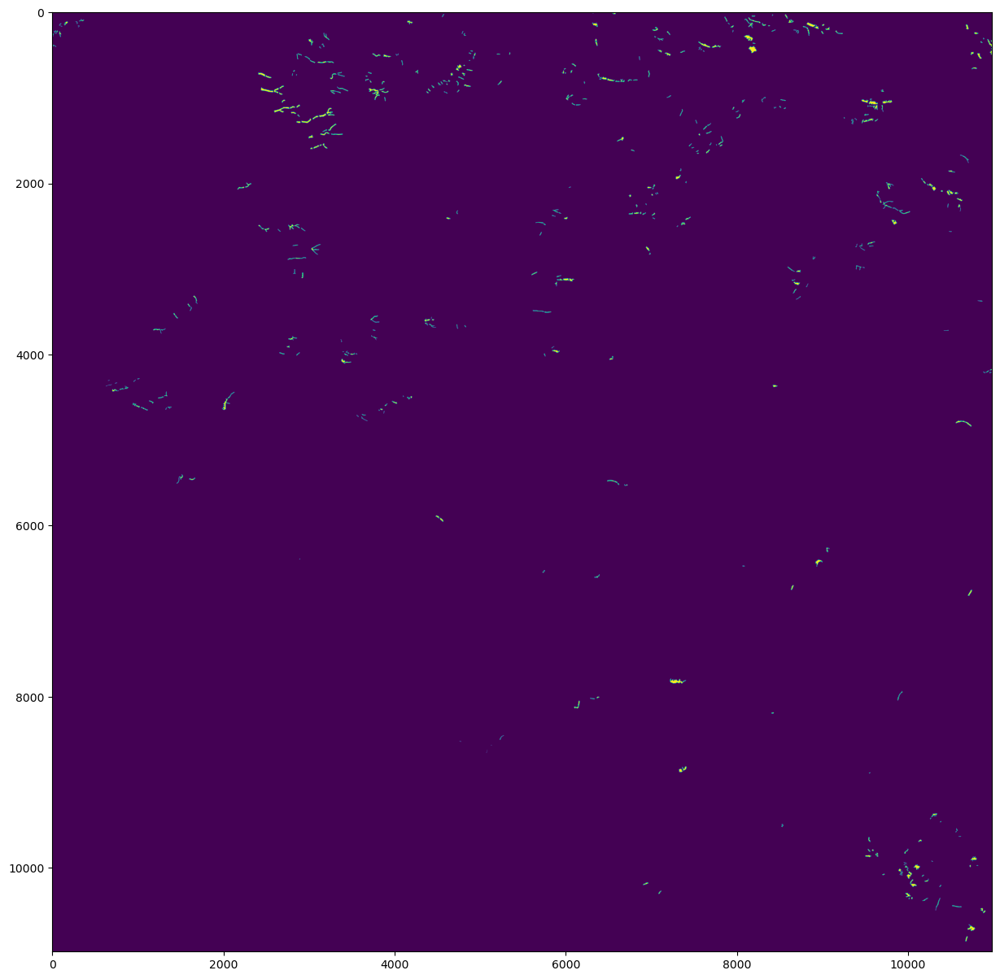

In [27]:
# rasterize works with polygons that are in image coordinate system

def poly_from_utm(polygon, transform):
    poly_pts = []
    
    # make a polygon from multipolygon
    poly = cascaded_union(polygon)
    #poly = unary_union(polygon)
    for i in np.array(poly.exterior.coords):
        
        # transfrom polygon to image crs, using raster meta
        poly_pts.append(~transform * tuple(i))
        
    # make a shapely Polygon object
    new_poly = Polygon(poly_pts)
    return new_poly

# creating binary mask for field/not_filed segmentation.

poly_shp = []
im_size = (src.meta['height'], src.meta['width'])
for num, row in train_df.iterrows():
    if row['geometry'].geom_type == 'Polygon':
        poly = poly_from_utm(row['geometry'], src.meta['transform'])
        poly_shp.append(poly)
    else:
        for p in row['geometry']:
            poly = poly_from_utm(p, src.meta['transform'])
            poly_shp.append(poly)

mask = rasterize(shapes=poly_shp,
                 out_shape=im_size)

# plotting the mask

plt.figure(figsize=(15,15))
plt.imshow(mask)

Saving binary mask

In [32]:
bin_mask_meta = src.meta.copy()
bin_mask_meta.update({'count': 1})
with rasterio.open("train_jpy.jp2", 'w', **bin_mask_meta) as dst:
    dst.write(mask * 255, 1)